<img width="800px" src="./img/OpenClassroom_LOGO.png"></img>
# <!-- TITLE --> [P08] -  App Dating / Prédiction des Likes
<!-- DESC --> Episode 1 : Analyses des données, classifications, et visualisation
<!-- AUTHOR : Philippe HOTON (OpenClassRooms) -->

## Objectifs :
 - Comprendre les données
 - Définir une classification des visages

Savoir si une personne plaît à une autre dépend de plusieurs facteurs :
la présentation textuelle, les goûts, la personnalité, les valeurs présentés 
les photos du profil, le visage, la silhouette,  la tenue vestimentaire, le décor, l’entourage, qui donnent une idée dans quel milieu social, la personne évolue etc
Ici, nous allons nous  concentrer uniquement sur le visage.

## ce que nous allons faire :

 - Vectorisation des images
 - Nettoyage du dataset
 - Visualisation des clusters 

In [1]:
%matplotlib inline

In [2]:
# import the necessary packages
from imutils import paths
import pickle
import cv2
import os, os.path
from sklearn.cluster import DBSCAN
from imutils import build_montages
import face_recognition
import numpy as np
import pandas as pd
import random
from functions import *
import os.path
from os import path


In [3]:
imagePaths = list(paths.list_images("./dataset"))
pathEncodings ="./save/encodings.pickle"
data=None
len(imagePaths)

7220

In [4]:
# Load Serialized
print("[INFO] loading encodings...")
if path.isfile(pathEncodings):
    data = pickle.loads(open(pathEncodings, "rb").read())
    data = np.array(data)
    encodings = [d["encoding"] for d in data]

[INFO] loading encodings...


## Fonctions

In [5]:
# grab the paths to the input images in our dataset, then initialize
# out data list (which we'll soon populate)
if data is None:
    
    print("[INFO] quantifying faces...")
    data = []

    # loop over the image paths
    for (i, imagePath) in enumerate(imagePaths):
        # load the input image and convert it from RGB (OpenCV ordering)
        # to dlib ordering (RGB)
        print("[INFO] processing image {}/{}".format(i + 1,len(imagePaths)),"\r",end='')
        #print(imagePath)
        image = cv2.imread(imagePath)
        rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # detect the (x, y)-coordinates of the bounding boxes
        # corresponding to each face in the input image
        boxes = face_recognition.face_locations(rgb,model='hog')  # or cnn
        # compute the facial embedding for the face
        encodings = face_recognition.face_encodings(rgb, boxes)
        # build a dictionary of the image path, bounding box location,
        # and facial encodings for the current image
        d = [{"imagePath": imagePath, "loc": box, "encoding": enc}	for (box, enc) in zip(boxes, encodings)]
        data.extend(d)
    print("[INFO] serializing encodings...")
    f = open(pathEncodings, "wb")
    f.write(pickle.dumps(data))
    f.close()



In [6]:
if data is not None:
    print("[INFO] serializing encodings...")
    f = open(pathEncodings, "wb")
    f.write(pickle.dumps(data))
    f.close()

[INFO] serializing encodings...


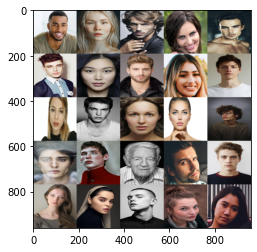

In [7]:

data_toshuffle = [img for img in data]
random.shuffle(data_toshuffle)
faces = []
for img_vector in data_toshuffle:
    # load the input image and extract the face ROI
    image = cv2.imread(img_vector["imagePath"])
   
    # force resize the face ROI to 96x96 and then add it to the
    # faces montage list
    image = cv2.resize(image, (192, 192))
    faces.append(image)
    if len(faces)==25:
        break
montage = build_montages(faces, (192, 192), (5, 5))[0]
# show the output montage
title = "Some Images "
cv2.imshow(title, montage)
# load image using cv2....and do processing.
plt.imshow(cv2.cvtColor(montage, cv2.COLOR_BGR2RGB))
#plt.imshow(montage)

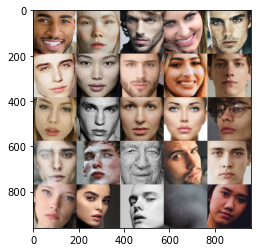

In [8]:


faces = []
for img_vector in data_toshuffle:
    # load the input image and extract the face ROI
    image = cv2.imread(img_vector["imagePath"])
    (top, right, bottom, left) = img_vector["loc"]
    face = image[top:bottom, left:right]
    # force resize the face ROI to 96x96 and then add it to the
    # faces montage list
    face = cv2.resize(face, (192, 192))
    faces.append(face)
    if len(faces)==25:
        break
montage = build_montages(faces, (192, 192), (5, 5))[0]
# show the output montage
title = "Some Faces "
#cv2.imshow(title, montage)

import matplotlib.pyplot as plt
# load image using cv2....and do processing.
plt.imshow(cv2.cvtColor(montage, cv2.COLOR_BGR2RGB))
#plt.imshow(montage)

In [9]:
if path.isfile("./save/img_vectorize.csv"):
    df=pd.read_csv("./save/img_vectorize.csv")

In [10]:
if df is None:
    d= { "file":[],"top":[], "right":[], "bottom":[], "left":[] }
    for i,x in enumerate(data[0]["encoding"]):
            d["x"+str(i)]=[]
    df = pd.DataFrame(d) 
    for img_vector in data:
        (top, right, bottom, left) = img_vector["loc"]
        d= { "file":img_vector["imagePath"],"top":top, "right":right, "bottom":bottom, "left":left }
    
        for i,x in enumerate(img_vector["encoding"]):
            d["x"+str(i)]=x
        df=df.append(d,ignore_index=True)
    
    df.to_csv("./save/img_vectorize.csv")  
df


,Unnamed: 0,file,top,right,bottom,left,x0,x1,x2,x3,...,x118,x119,x120,x121,x122,x123,x124,x125,x126,x127
0,0,./dataset/1 (603).jpg,613.0,1252.0,1764.0,102.0,-0.248466,0.165493,0.057760,-0.062713,...,0.159249,0.039894,0.005723,0.011792,-0.035999,-0.014393,0.028370,-0.075481,0.133445,0.077274
1,1,./dataset/1 (2054).jpg,204.0,546.0,590.0,161.0,-0.046499,0.091484,0.049523,-0.041596,...,0.097092,0.091814,0.033399,-0.064595,-0.110594,-0.049044,-0.012096,-0.015877,0.074071,0.070452
2,2,./dataset/1 (3251).jpg,997.0,1891.0,2147.0,741.0,-0.170042,0.029028,0.117027,-0.146727,...,0.035025,0.101982,-0.107194,-0.031898,-0.202829,-0.045158,-0.006642,-0.061492,0.016056,0.096328
3,3,./dataset/1 (1099).jpg,345.0,489.0,531.0,304.0,-0.137504,0.052539,0.056684,-0.073750,...,0.013753,0.101000,-0.029645,-0.016284,-0.125121,-0.074811,0.010170,-0.031191,-0.056278,0.085600
4,4,./dataset/1 (2284).jpg,217.0,365.0,440.0,142.0,-0.131571,0.044169,0.058138,-0.111237,...,0.054975,0.019909,0.008285,-0.055123,-0.189194,-0.050956,0.091764,-0.020493,0.033441,0.070436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6844,6844,./dataset/1 (3204).jpg,295.0,1281.0,850.0,726.0,-0.132410,0.113229,0.156563,-0.014253,...,0.028208,0.082140,-0.057139,-0.025209,-0.118657,-0.126343,0.086524,-0.028794,-0.027061,-0.048848
6845,6845,./dataset/1 (5912).jpg,204.0,504.0,590.0,118.0,-0.053324,0.030300,-0.004913,-0.115817,...,0.041083,0.132364,0.024660,-0.114573,-0.202738,-0.009074,0.069677,0.026955,0.003002,0.098337
6846,6846,./dataset/1 (1993).jpg,426.0,1046.0,1224.0,248.0,-0.176347,0.179598,0.034981,-0.072944,...,0.060289,0.023395,0.007884,-0.092547,-0.020462,-0.127343,0.061926,-0.028038,0.079845,0.003710
6847,6847,./dataset/1 (1794).jpg,650.0,946.0,1316.0,280.0,-0.115555,0.021720,-0.004830,-0.034871,...,-0.048145,0.031265,0.036258,-0.107874,-0.113479,-0.012717,0.165961,-0.022089,0.124618,0.022014


In [11]:
dfdescribe = df.describe().T.head(13)
dfdescribe

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,6849.0,3424.000000,1977.280329,0.000000,1712.000000,3424.000000,5136.000000,6848.000000
top,6849.0,292.107753,434.151954,0.000000,162.000000,206.000000,290.000000,5254.000000
right,6849.0,681.002044,546.979425,37.000000,438.000000,504.000000,707.000000,6140.000000
bottom,6849.0,772.344576,655.953562,115.000000,504.000000,562.000000,788.000000,5292.000000
left,6849.0,202.069791,273.074593,0.000000,91.000000,134.000000,204.000000,4152.000000
x0,6849.0,-0.112046,0.051751,-0.302346,-0.145972,-0.113915,-0.077090,0.076347
x1,6849.0,0.089499,0.051103,-0.077878,0.054377,0.089298,0.123322,0.276324
x2,6849.0,0.063426,0.046600,-0.087396,0.031709,0.063326,0.095016,0.209479
x3,6849.0,-0.073174,0.046636,-0.223037,-0.105286,-0.076629,-0.044364,0.096704
x4,6849.0,-0.124594,0.050148,-0.294598,-0.157947,-0.126165,-0.092871,0.069063


In [12]:
len(data)

6849

## Nettoyage des données
 Plusieurs images apparaissent en double, pour repérer ses images, nous allons pour chaque image, calculer sa plus proche image (en vecteur).
 Et lui attribuer une distance, à partir d'un seuil, on le qualifiera de doublon

In [13]:
if path.isfile("./save/unique_img_vectorize.csv"):
    df=pd.read_csv("./save/unique_img_vectorize.csv")
else:
    copy=[]
    dists=[]
    fields= [ "x"+str(i) for i in range(128)	]
    n_comp=len(fields)
    X = df[fields].values
    for i,img1 in enumerate(X):
        v=-1
        dist=1000
        for j,img2 in enumerate(X):
            if(j==i):
                copy.append(v)
                dists.append(dist)
                break
            dist_cdt=np.sum((img2-img1)*(img2-img1))
            if  dist>dist_cdt:
                dist=dist_cdt
                v=j
    df["copy"]=copy
    df["dist"]=dists
    df= df[df.dist!=0].reset_index()
    df.to_csv("./save/unique_img_vectorize.csv") 

In [14]:
# 3552 Doublons !!


## Création des vignettes

In [15]:
if not path.isfile("./thumbs/img%d.png"  % (len(df))):
    N=0
    i=0
    for filename in df["file"].values:
            i+=1
            if(i<=N):
                continue
            N=N+1
            print(N, " :", filename ,"\r", end="")
            thumb(filename,"./thumbs/img%d.png"  % (N))

/Users/philippe/opt/anaconda3/lib/python3.8/site-packages/PIL/Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


## Centrage et réduction

In [16]:
from sklearn import decomposition
from sklearn import preprocessing
fields= [ "x"+str(i) for i in range(128)	]
names=["./thumbs/img"+str(i)+".png" for i in range(len(df)+1)]
n_comp=len(fields)
X = df[fields].values
std_scale = preprocessing.StandardScaler().fit(X)
pickle.dump(std_scale, open("./save/std_scale.pkl", "wb"))
X_std = std_scale.transform(X)
pickle.dump(X_std, open("./save/X_std.pkl", "wb"))
X_std

array([[-2.60010715,  1.53672536, -0.0562006 , ..., -0.65728207,
         1.74397495,  0.8249532 ],
       [ 1.25924587,  0.10624391, -0.23366643, ...,  0.59775108,
         0.60913411,  0.66738244],
       [-1.10152288, -1.10094718,  1.22057886, ..., -0.36272978,
        -0.49972032,  1.26505939],
       ...,
       [-1.82181458,  1.48778945,  1.35377856, ..., -1.4712777 ,
         0.27674422,  2.09996007],
       [-0.49259445, -0.40497224, -0.20602094, ...,  0.23770815,
        -1.98115114,  1.02241688],
       [ 1.1288326 , -1.07636503, -1.40637908, ...,  1.49964052,
        -0.74922891,  1.31146213]])

[ 460 2042 3043  306 1723]


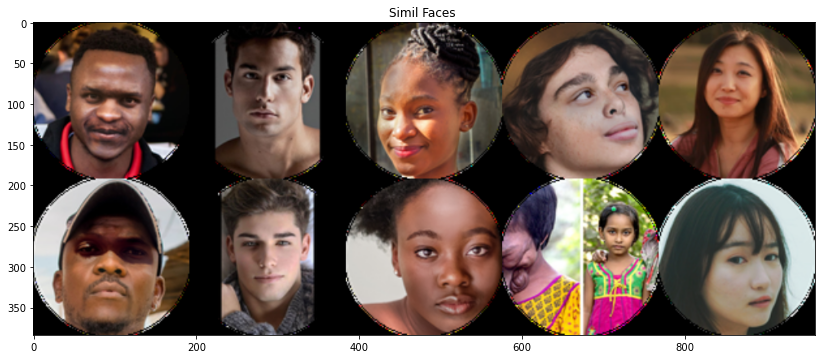

In [17]:
num= np.random.randint(len(names), size=5)
print(num)
show_nearest(np.random.randint(len(names), size=5),names,X_std)
#ACP beach


In [18]:
len(np.random.randint(len(names), size=10))

10

In [19]:
len(X_std[0])

128

In [20]:

# Calcul des composantes principales
pca = decomposition.PCA(n_components=64,random_state=42)
pca.fit(X_std)
data_sortie= pca.fit_transform(X_std)
pickle.dump(pca, open("./save/pca.pkl", "wb"))
pickle.dump(data_sortie, open("./save/data_sortie.pkl", "wb"))
#  

In [21]:
np.shape([])

(0,)

In [55]:
def pareto(data) :

    from matplotlib.ticker import PercentFormatter

    y = list(data)

    x = range(len(data))

    ycum = np.cumsum(y)/sum(y)*100

   
    fig, ax = plt.subplots(figsize=(10,5))

    ax.bar(x,y,color="yellow")

    ax2 = ax.twinx()

    ax2.plot(x,ycum, color="C1", marker="D", ms=4)

    ax2.axhline(y=80,color="r")

    ax2.yaxis.set_major_formatter(PercentFormatter())

    ax.tick_params(axis="y", colors="C0")

    ax2.tick_params(axis="y", colors="C1")

    plt.ylim(0,110)
    plt.title(" Cumul de variance expliquée par les facteurs")
    plt.ylabel("Cumul expliqué de la variance ratio")
    plt.xlabel("nombre de facteurs")
    plt.show()

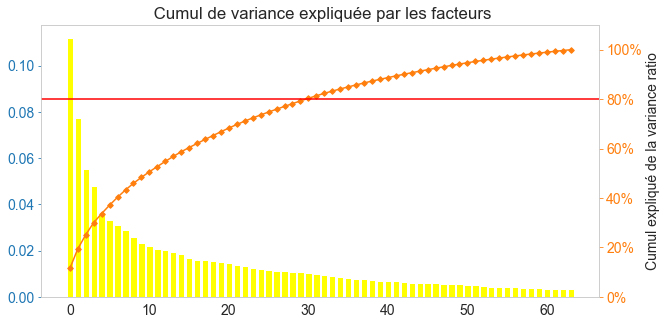

In [56]:
pareto(pca.explained_variance_ratio_)

In [23]:
# Critères normaux : age, origine ethnique, genre, ...

## Kmeans 

In [24]:
# Boucle de clusters de 1 à 50 
labels_={}
centers_={}
kms_={}
for iclusters in [12,24,48]:
    labels,centers,km =clustering(iclusters,data_sortie)
    labels_[iclusters]=labels
    centers_[iclusters]=centers
    
    kms_[iclusters]=km
    pickle.dump(labels, open("./save/labels_"+ str(iclusters)+".pkl", "wb"))
    pickle.dump(centers, open("./save/centers_"+ str(iclusters)+".pkl", "wb"))
    pickle.dump(km, open("./save/kmeans_"+ str(iclusters)+".pkl", "wb"))
    print(iclusters)
    iclusters+=1

    
    
  

12
24
48


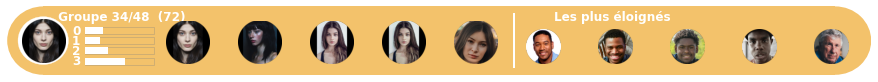

In [25]:
iface=308
clusterId=48
show_cardface(names[iface+1],data_sortie[iface],labels_[clusterId],centers_[clusterId],data_sortie,kms_[clusterId],names)

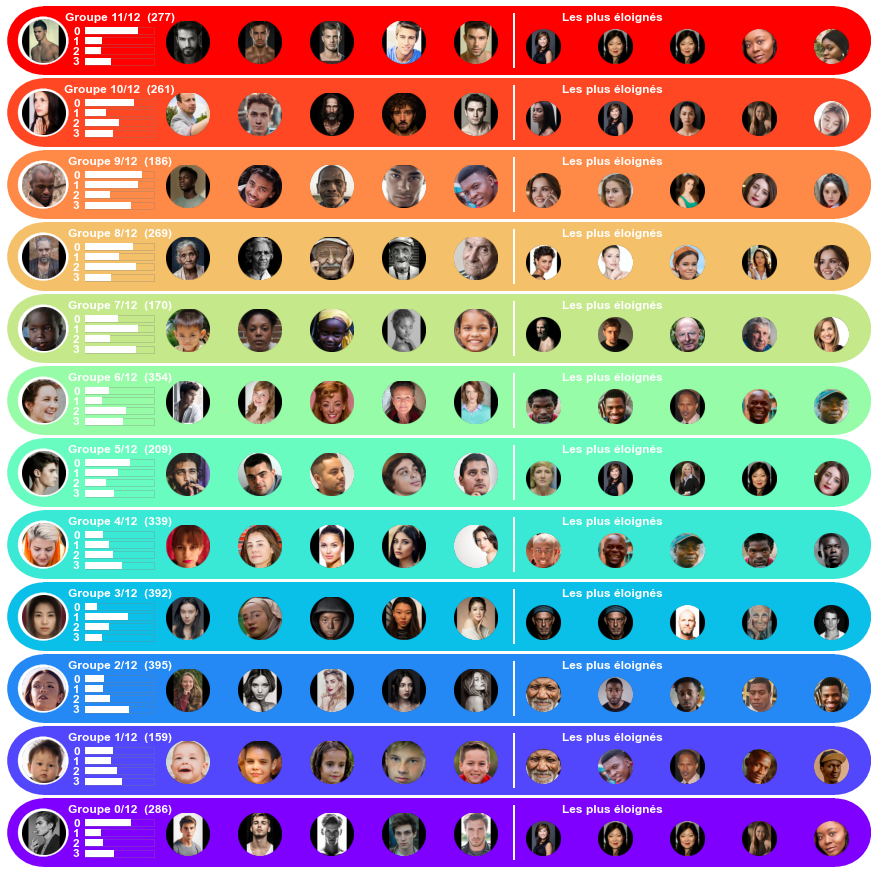

In [54]:
show_clusterfaces(labels_[12],centers_[12],data_sortie,names)

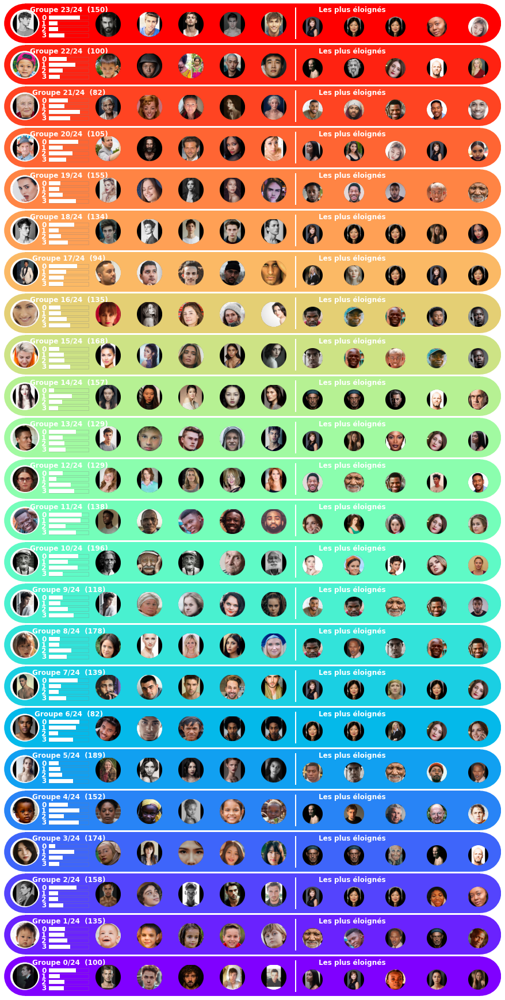

In [26]:
show_clusterfaces(labels_[24],centers_[24],data_sortie,names)

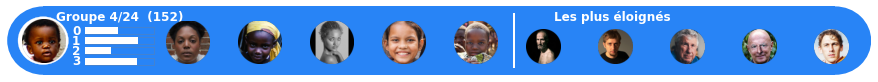

In [27]:
show_clusterfaces(labels_[24],centers_[24],data_sortie,names,only=4)

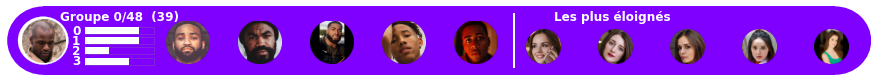

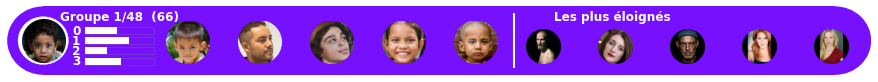

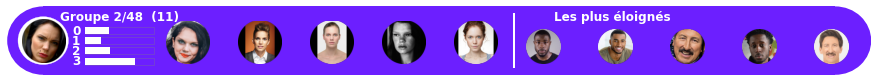

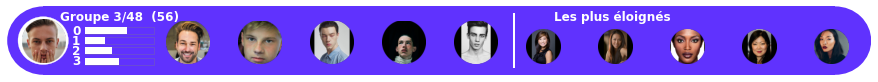

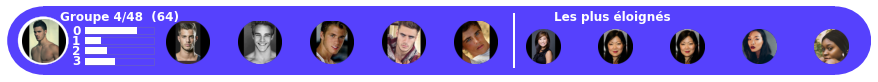

...

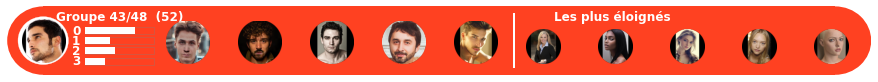

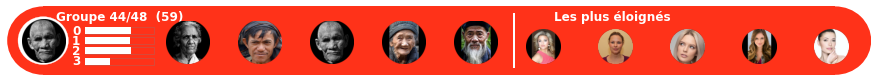

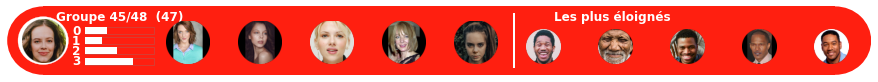

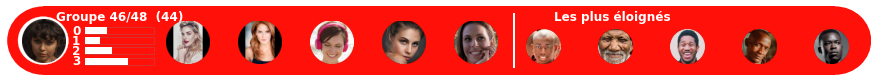

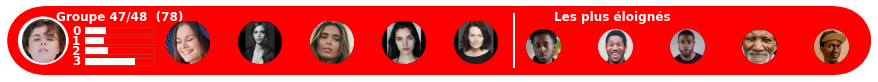

In [28]:
for i in range(48):
    show_clusterfaces(labels_[48],centers_[48],data_sortie,names,only=i)

## Labellisation manuelle des 48 clusters


In [29]:
label_grp = { 
0:{"origin":"AFRO","age":"A","gender":"M"},
1:{"origin":"EURA","age":"Y","gender":"M"},
2:{"origin":"EURO","age":"A","gender":"F"},
3:{"origin":"EURO","age":"A","gender":"M"},
4:{"origin":"EURO","age":"A","gender":"M"},
5:{"origin":"ASIE","age":"A","gender":"F"},
6:{"origin":"EURO","age":"O","gender":"M"},
7:{"origin":"EURO","age":"A","gender":"M"},
8:{"origin":"EURO","age":"A","gender":"F"},
9:{"origin":"AFRO","age":"A","gender":"M"},
10:{"origin":"EURO","age":"A","gender":"F"},
11:{"origin":"AFRO","age":"Y","gender":""},
12:{"origin":"EURO","age":"A","gender":"F"},
13:{"origin":"EURO","age":"A","gender":"F"},
14:{"origin":"","age":"","gender":""},
15:{"origin":"","age":"O","gender":""},
16:{"origin":"EURO","age":"A","gender":"F"},
17:{"origin":"AFRO","age":"A","gender":"F"},
18:{"origin":"EURO","age":"A","gender":"M"},
19:{"origin":"EURO","age":"A","gender":"M"},
20:{"origin":"EURO","age":"A","gender":"F"},
21:{"origin":"EURO","age":"O","gender":"F"},
22:{"origin":"EURO","age":"A","gender":"F"},
23:{"origin":"EURO","age":"A","gender":"F"},
24:{"origin":"EURO","age":"A","gender":"F"},
25:{"origin":"ASIE","age":"A","gender":"F"},
26:{"origin":"AFRO","age":"A","gender":"M"},
27:{"origin":"EURO","age":"A","gender":"M"},
28:{"origin":"AFRO","age":"A","gender":"M"},
29:{"origin":"ASIE","age":"A","gender":"F"},
30:{"origin":"EURO","age":"A","gender":"M"},
31:{"origin":"EURO","age":"A","gender":"F"},
32:{"origin":"EURO","age":"A","gender":"M"},
33:{"origin":"EURO","age":"A","gender":"F"},
34:{"origin":"EURO","age":"A","gender":"F"},
35:{"origin":"","age":"Y","gender":""},
36:{"origin":"EURO","age":"A","gender":"F"},
37:{"origin":"EURO","age":"A","gender":"F"},
38:{"origin":"EURO","age":"A","gender":"M"},
39:{"origin":"EURO","age":"A","gender":"M"},
40:{"origin":"ASIE","age":"A","gender":""},
41:{"origin":"EURO","age":"A","gender":"F"},
42:{"origin":"EURO","age":"A","gender":"M"},
43:{"origin":"EURO","age":"A","gender":"M"},
44:{"origin":"ASIE","age":"O","gender":""}, 
45:{"origin":"EURO","age":"A","gender":"F"},
46:{"origin":"EURO","age":"A","gender":"F"},
47:{"origin":"EURO","age":"A","gender":"F"}}

In [30]:
print( "label_grp = { "  +  ",\n".join([ str(i)+ ':{"origin":"","age":"","gender":""}'  for i in range(48)])  +  "}"  )

label_grp = { 0:{"origin":"","age":"","gender":""},
1:{"origin":"","age":"","gender":""},
2:{"origin":"","age":"","gender":""},
3:{"origin":"","age":"","gender":""},
4:{"origin":"","age":"","gender":""},
5:{"origin":"","age":"","gender":""},
6:{"origin":"","age":"","gender":""},
7:{"origin":"","age":"","gender":""},
8:{"origin":"","age":"","gender":""},
9:{"origin":"","age":"","gender":""},
10:{"origin":"","age":"","gender":""},
11:{"origin":"","age":"","gender":""},
12:{"origin":"","age":"","gender":""},
13:{"origin":"","age":"","gender":""},
14:{"origin":"","age":"","gender":""},
15:{"origin":"","age":"","gender":""},
16:{"origin":"","age":"","gender":""},
17:{"origin":"","age":"","gender":""},
18:{"origin":"","age":"","gender":""},
19:{"origin":"","age":"","gender":""},
20:{"origin":"","age":"","gender":""},
21:{"origin":"","age":"","gender":""},
22:{"origin":"","age":"","gender":""},
23:{"origin":"","age":"","gender":""},
24:{"origin":"","age":"","gender":""},
25:{"origin":"","age"

In [31]:
grp_lbl = {}
for i in label_grp:
    label_grp[i]["lbl"]=label_grp[i]["origin"]+"_"+ label_grp[i]["gender"]+ "_"+label_grp[i]["age"]
    grp_lbl[i]=label_grp[i]["lbl"]

In [32]:
label_sg = sorted(list(dict.fromkeys(grp_lbl.values()).keys())) 
label_sg

['AFRO_F_A',
 'AFRO_M_A',
 'AFRO__Y',
 'ASIE_F_A',
 'ASIE__A',
 'ASIE__O',
 'EURA_M_Y',
 'EURO_F_A',
 'EURO_F_O',
 'EURO_M_A',
 'EURO_M_O',
 '__',
 '__O',
 '__Y']

In [33]:
label_named=['Femmes Adultes Afro.',
             'Hommes Adultes Afro.',
 'Enfants Afro.',
 'Femmes Adultes Asie',
 'Adultes Asie',
 'Seniors Asie',
 'Hommes Enfants Eurasie.',
 'Femmes Adultes Euro.',
 'Femmes Seniors Euro.',
 'Hommes Adultes Euro.',
 'Hommes Seniors Euro.',
 'N.D',
 'Seniors',
 'Enfants']

In [34]:
print(len(label_sg) ,len(label_named) )

14 14


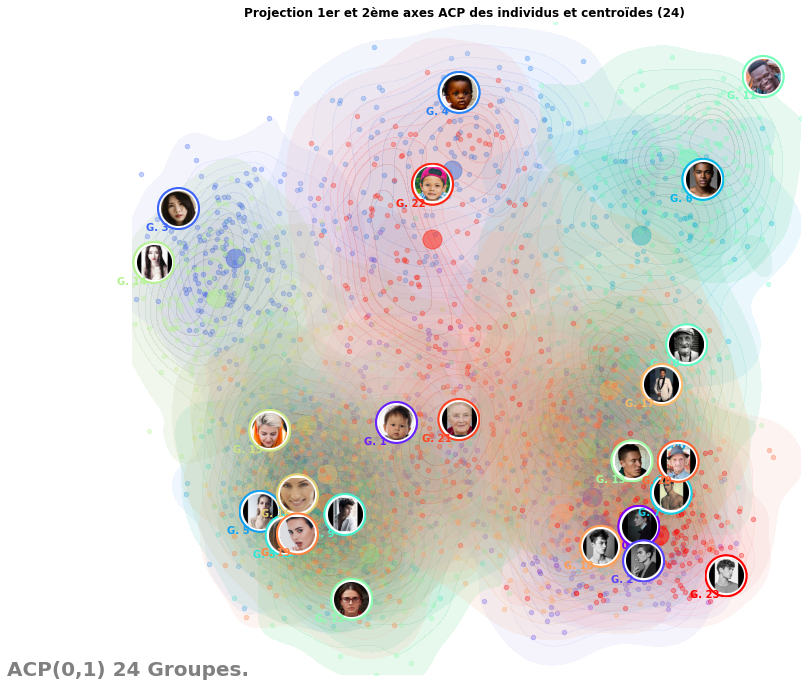

In [35]:
size=24
show_mapcentroids("Projection 1er et 2ème axes ACP des individus et centroïdes (24) ",[0,1],data_sortie,labels_[size],centers_[size],names)

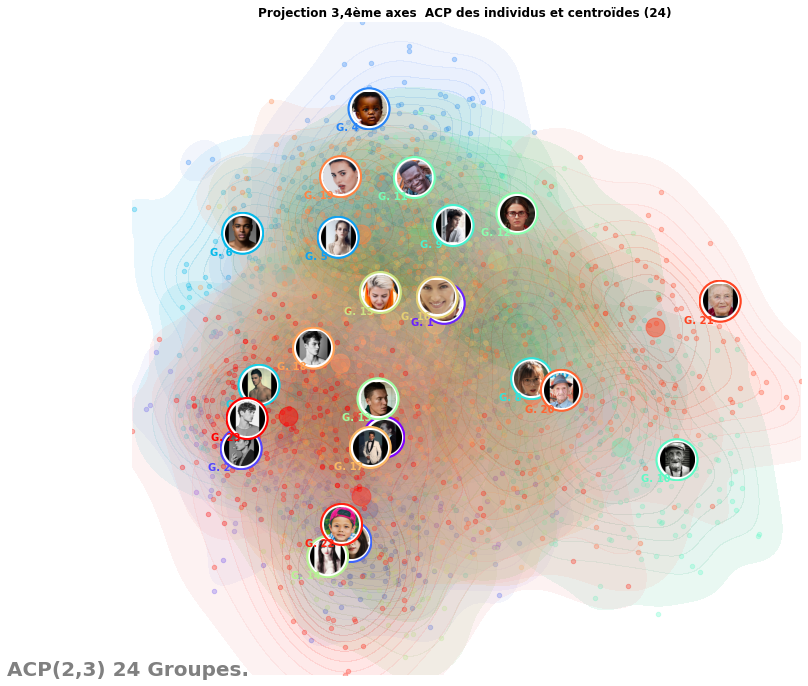

In [36]:
show_mapcentroids("Projection 3,4ème axes  ACP des individus et centroïdes (24) ",[2,3],data_sortie,labels_[size],centers_[size],names)

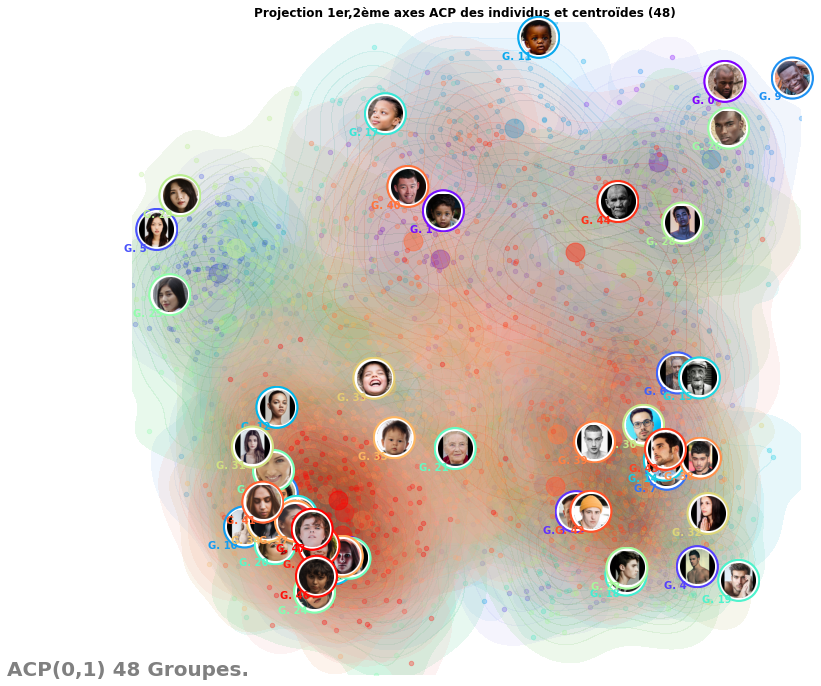

In [37]:
show_mapcentroids("Projection 1er,2ème axes ACP des individus et centroïdes (48) ", [0,1],data_sortie,labels_[48],centers_[48],names)

In [38]:
if not path.isfile("./save/df_final_acp.csv"):
    d= { "file":[],"l12":[],"l24":[],"l48":[] }
    for i,x in enumerate(data_sortie[0]):
        d["a"+str(i)]=[]
    df_final_acp = pd.DataFrame(d) 
    for i,img_vector in enumerate(data_sortie):
        d= { "file":names[i+1],"l12":labels_[12][i],"l24":labels_[24][i],"l48":labels_[48][i] }
        for iv,x in enumerate(img_vector):
            d["a"+str(iv)]=x
        df_final_acp=df_final_acp.append(d,ignore_index=True)
    
    df_final_acp.to_csv("./save/df_final_acp.csv")
else:
    df_final_acp= pd.read_csv("./save/df_final_acp.csv")    
df_final_acp

,file,l12,l24,l48,a0,a1,a2,a3,a4,a5,...,a54,a55,a56,a57,a58,a59,a60,a61,a62,a63
0,./thumbs/img1.png,11.0,23.0,38.0,5.494500,-2.442959,-4.692591,-3.360834,-1.672883,-0.035453,...,0.394975,0.078885,-0.507660,0.487351,0.853808,0.031924,0.361552,0.238025,0.551256,0.247617
1,./thumbs/img2.png,11.0,2.0,27.0,4.627457,-3.056760,-2.566179,-1.839070,-0.254608,-0.473232,...,-1.017128,0.297850,-0.246392,0.769185,-0.348603,-0.317958,0.712507,-0.029177,0.735370,0.131521
2,./thumbs/img3.png,2.0,5.0,34.0,-5.026254,-0.421146,1.319408,2.160254,0.100988,-4.529814,...,0.820299,0.961725,-0.612701,0.602260,-0.254844,-1.301057,1.005692,-1.170285,0.229497,0.053670
3,./thumbs/img4.png,6.0,9.0,36.0,-0.194564,-0.495995,2.628784,2.165168,0.133478,-3.308430,...,-0.577544,-0.068126,0.197312,-0.471707,-0.138507,0.192788,-1.979294,0.820430,-0.026248,0.347512
4,./thumbs/img5.png,0.0,13.0,32.0,1.982947,-2.024807,-2.181717,-0.307380,3.365788,-2.077009,...,-0.365081,-0.000781,0.277135,0.640581,-0.538954,0.028821,0.219470,-0.404097,-0.531169,-0.313724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3292,./thumbs/img3293.png,6.0,9.0,46.0,-1.141960,-1.854244,0.788925,3.299030,3.672383,1.828492,...,0.716425,0.560877,-0.605524,-1.167936,-1.029066,-0.736672,-0.843406,-0.497218,-1.630263,1.053530
3293,./thumbs/img3294.png,6.0,8.0,16.0,-3.679078,-1.412182,5.234755,-2.133667,-2.389422,0.356811,...,0.160321,0.728735,0.356961,0.487876,-0.623556,0.700495,0.291137,-0.210862,1.026638,0.776300
3294,./thumbs/img3295.png,4.0,5.0,31.0,-4.996038,0.204571,-0.081395,0.137128,-5.480306,-2.036312,...,-0.274375,-0.664329,-1.767645,-0.456793,0.463083,0.131413,0.872908,-0.126722,-1.524196,-0.254358
3295,./thumbs/img3296.png,6.0,8.0,16.0,-0.706262,-2.751836,1.740403,-1.328867,-0.609543,-2.488640,...,-1.472408,0.159657,-1.142633,-1.444232,0.786747,0.392039,0.934875,0.467480,0.794746,0.078694


In [39]:
len(data_sortie)

3297

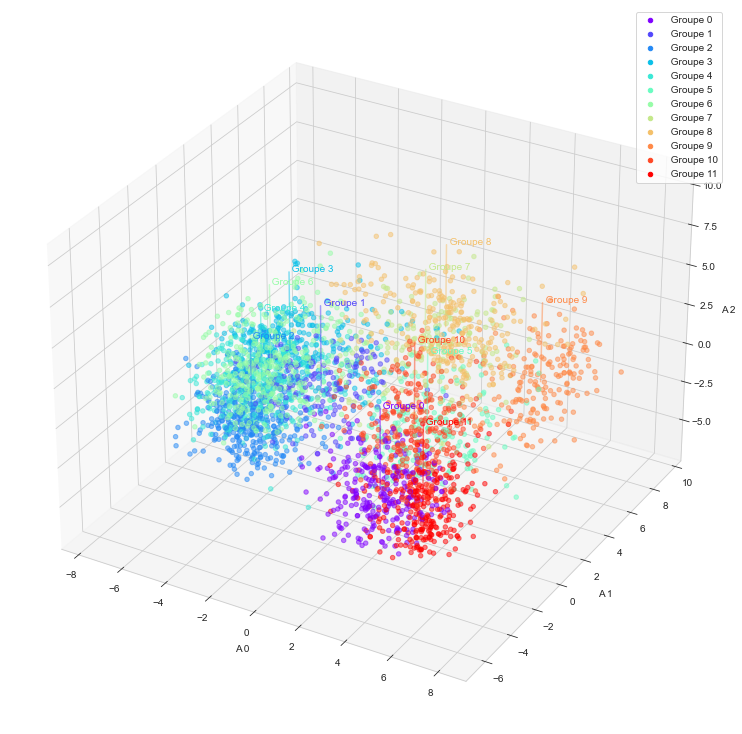

In [40]:


import re, seaborn as sns, numpy as np, pandas as pd, random
from pylab import *
from matplotlib.pyplot import plot, show, draw, figure, cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap


nclusters=12
sns.set_style("whitegrid", {'axes.grid' : False})

fig = plt.figure(figsize=(10,10))
labels=[" Groupe "+ str(i)  for i  in range(nclusters)]
ax = Axes3D(fig) # Method 1
# ax = fig.add_subplot(111, projection='3d') # Method 2

x = [v[0] for v in data_sortie]
y = [v[1] for v in data_sortie]
z = [v[2] for v in data_sortie]
colors=cm.rainbow(np.linspace(0,1,len(centers_[nclusters])))
cmap = ListedColormap(colors)

ax.scatter(x, y, z, marker='o',c=labels_[nclusters], cmap=cmap, alpha=0.5)
#,label=
for i,c in enumerate(centers_[nclusters]):
    ax.text(c[0], c[1], c[2]+5, " Groupe "+ str(i), None,color=colors[i])
    ax.plot([c[0],c[0]],[c[1],c[1]], [c[2],c[2]+5],color=colors[i], alpha=0.5)
ax.set_xlabel('A 0')
ax.set_ylabel('A 1')
ax.set_zlabel('A 2')
for i,l in enumerate(labels):
    ax.scatter([],[], [],color=colors[i], label=l)
    
ax.legend()

plt.show()

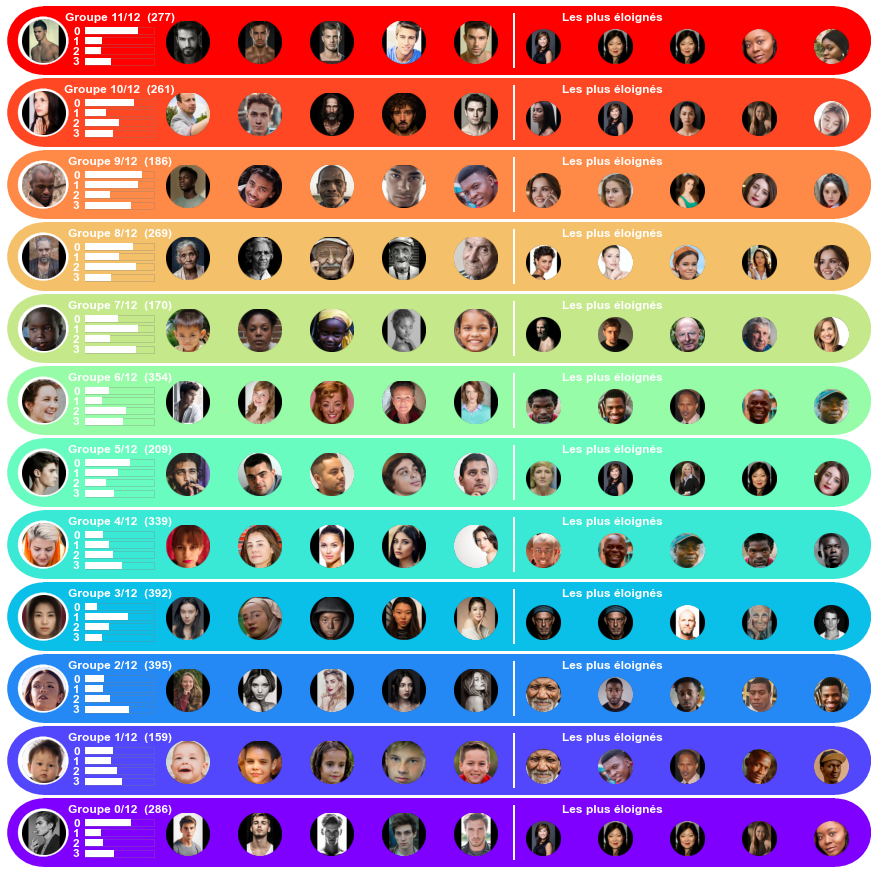

In [41]:
show_clusterfaces(labels_[12],centers_[12],data_sortie,names)

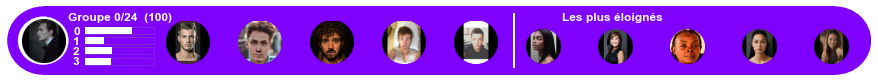

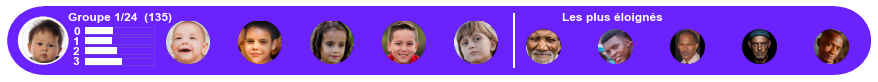

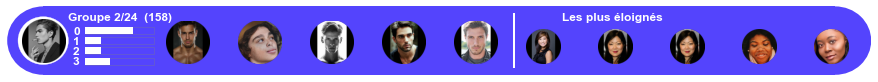

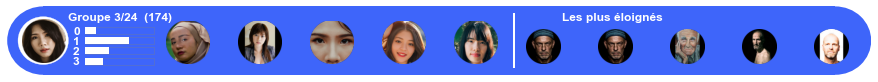

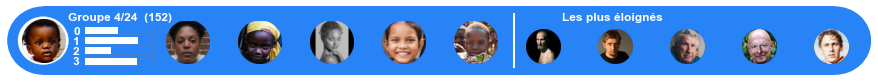

...

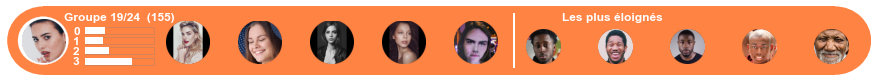

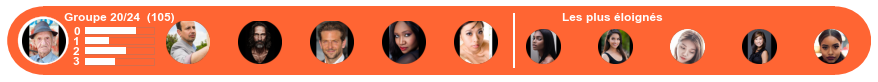

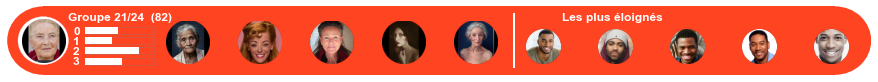

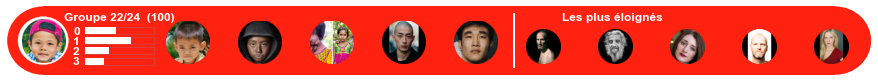

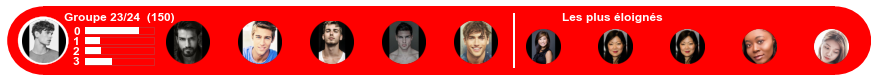

In [57]:
for i in range(24):
    show_clusterfaces(labels_[24],centers_[24],data_sortie,names,only=i)

In [42]:
km = pickle.load(open("./save/kmeans_48.pkl", "rb"))
pca = pickle.load(open("./save/pca.pkl", "rb"))
std_scale = pickle.load(open("./save/kmeans_12.pkl", "rb"))

## Labelisation des clusters
   A l'aide des 48 clusters formés, nous allons labelliser les individus  
   

In [43]:
from sklearn.metrics import pairwise_distances



In [44]:
centers_[48]

array([[ 4.69674498,  6.01536362, -1.00663842, ...,  0.16540682,
         0.0231011 ,  0.38786773],
       [-0.4188333 ,  3.66248885, -1.52108578, ...,  0.0221697 ,
        -0.04289663, -0.21227574],
       [-2.14848792, -2.63367541, -0.81537143, ..., -0.11797427,
         0.11351807, -0.01198177],
       ...,
       [-2.6800851 , -2.42203799,  0.88596298, ..., -0.0193463 ,
        -0.06574221, -0.14026511],
       [-2.72526251, -2.97950379, -0.35003649, ..., -0.02930278,
         0.14798224,  0.02790881],
       [-2.80438309, -2.12489008, -1.14228025, ..., -0.19405827,
         0.0976803 ,  0.14086851]])

In [45]:
# Tri des clusters par lbl
sorted_clusters = sorted(grp_lbl, key=grp_lbl.get)
[  grp_lbl[i]+ "_" + str(i)  for i in sorted_clusters]


['AFRO_F_A_17',
 'AFRO_M_A_0',
 'AFRO_M_A_9',
 'AFRO_M_A_26',
 'AFRO_M_A_28',
 'AFRO__Y_11',
 'ASIE_F_A_5',
 'ASIE_F_A_25',
 'ASIE_F_A_29',
 'ASIE__A_40',
 'ASIE__O_44',
 'EURA_M_Y_1',
 'EURO_F_A_2',
 'EURO_F_A_8',
 'EURO_F_A_10',
 'EURO_F_A_12',
 'EURO_F_A_13',
 'EURO_F_A_16',
 'EURO_F_A_20',
 'EURO_F_A_22',
 'EURO_F_A_23',
 'EURO_F_A_24',
 'EURO_F_A_31',
 'EURO_F_A_33',
 'EURO_F_A_34',
 'EURO_F_A_36',
 'EURO_F_A_37',
 'EURO_F_A_41',
 'EURO_F_A_45',
 'EURO_F_A_46',
 'EURO_F_A_47',
 'EURO_F_O_21',
 'EURO_M_A_3',
 'EURO_M_A_4',
 'EURO_M_A_7',
 'EURO_M_A_18',
 'EURO_M_A_19',
 'EURO_M_A_27',
 'EURO_M_A_30',
 'EURO_M_A_32',
 'EURO_M_A_38',
 'EURO_M_A_39',
 'EURO_M_A_42',
 'EURO_M_A_43',
 'EURO_M_O_6',
 '___14',
 '__O_15',
 '__Y_35']

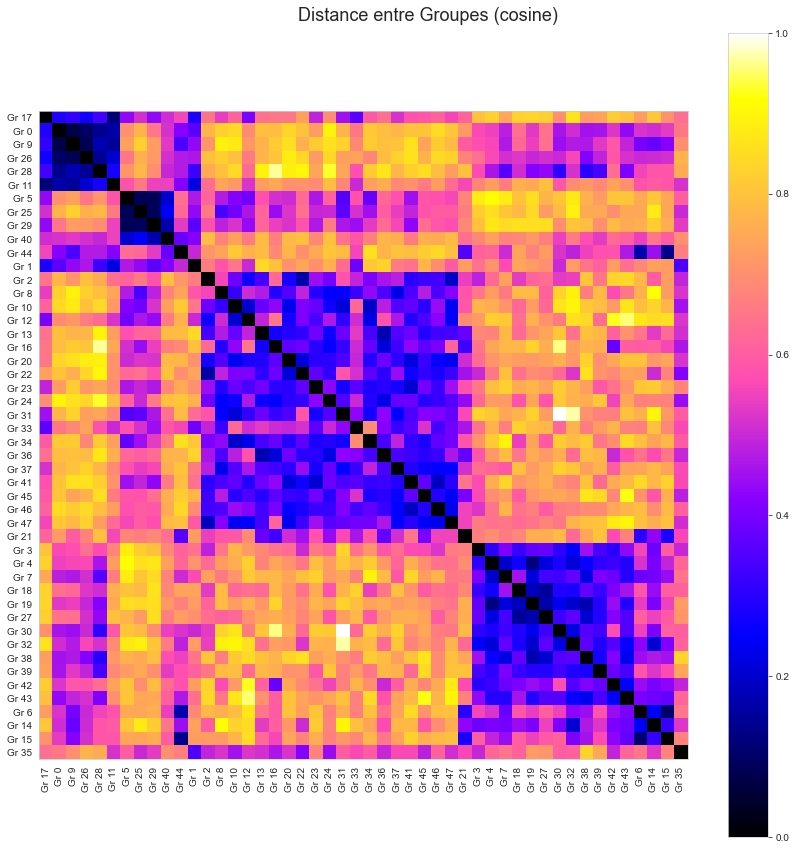

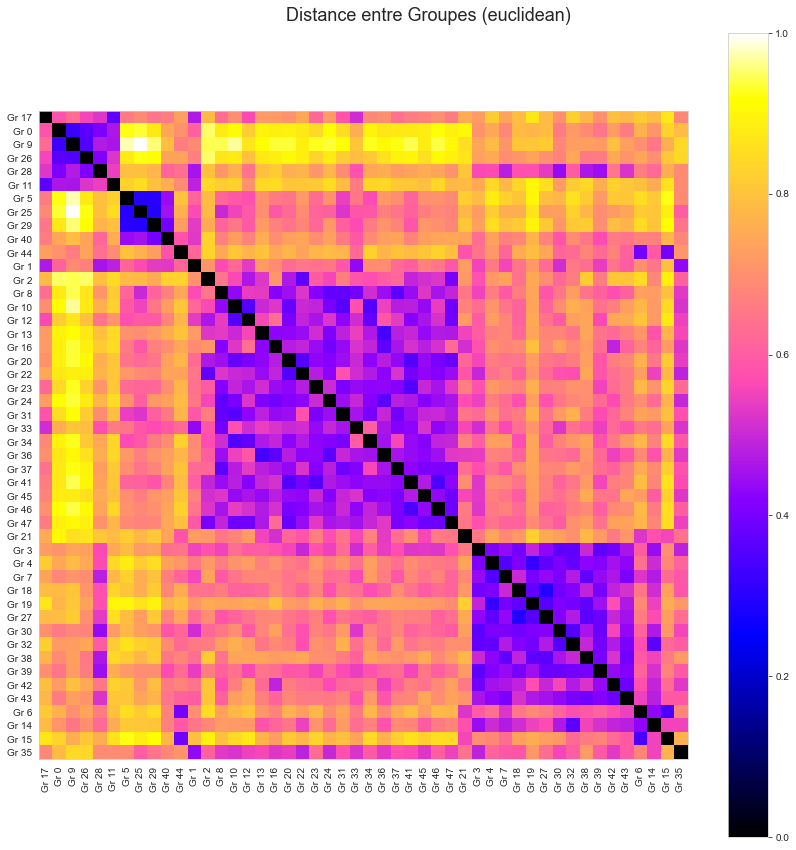

In [46]:
n_clusters=48
labels= [ "Gr "+ str(sorted_clusters[i]) for i in range(n_clusters)]
centers=centers_[n_clusters]
for index, metric in enumerate(["cosine", "euclidean"]):
    avg_dist = np.zeros((n_clusters, n_clusters))
    plt.figure(figsize=(12, 12))
    for i in range(n_clusters):
        for j in range(n_clusters):
            avg_dist[i, j] = pairwise_distances(
              [ centers[sorted_clusters[i]]],[centers[sorted_clusters[j]]], metric=metric
            ).mean()
    avg_dist /= avg_dist.max()
    
    plt.imshow(avg_dist, interpolation="nearest", cmap=plt.cm.gnuplot2, vmin=0)
    plt.xticks(range(n_clusters), labels, rotation=90)
    plt.yticks(range(n_clusters), labels)
    plt.colorbar()
    plt.suptitle("Distance entre Groupes (%s)" % metric, size=18)
    plt.tight_layout()


Text(0.5, 1.0, 'Network Clusters ')

<Figure size 1008x1008 with 0 Axes>

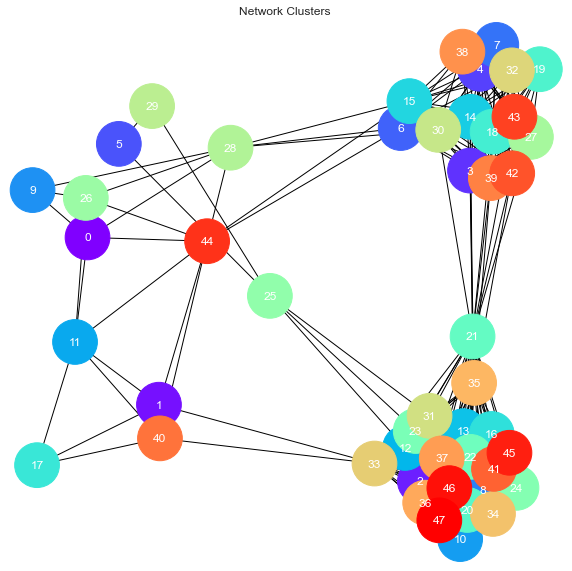

In [47]:
# libraries
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

dimmax=2

for index, metric in enumerate([ "euclidean"]):
    gr0 = []
    gr1 = []
    dist=[]
    nearest_clusters=[]
    avg_dist = np.zeros((n_clusters, n_clusters))
    plt.figure(figsize=(14, 14))
    for i in range(n_clusters):
        for j in range(n_clusters):
            avg_dist[i, j] = pairwise_distances(
              [ centers[i][:dimmax]],[centers[j][:dimmax]], metric=metric
            ).mean()
    avg_dist /= avg_dist.max()
    for i in range(n_clusters):
        nears={}
        for j in range(n_clusters):
            if i==j or avg_dist[i, j]>.3:
                continue
            nears[j]=avg_dist[i, j]
            if i<j :
                continue
            gr0.append(i)
            gr1.append(j)
            dist.append( avg_dist[i, j])
        nearest_clusters.append([ [k,nears[k]] for k in sorted( nears,key=nears.get)]) 

# Build a dataframe with your connections
df_nw = pd.DataFrame({ 'from':gr0, 'to':gr1, 'value':dist})
fig, ax = plt.subplots(figsize=(10, 10))
# Build your graph
G=nx.from_pandas_edgelist(df_nw, 'from', 'to', create_using=nx.Graph() )

colors=cm.rainbow(np.linspace(0,1,n_clusters))
values = [ colors[ node ] for node in G.nodes()]

# Custom the nodes:
nx.draw(G, with_labels=True, node_color=values, node_size=2000, edge_color="black", width=1.0, edge_cmap=plt.cm.Blues,font_color='white')
plt.title("Network Clusters ")

In [48]:

def show_cluster(img,title,subtitle,subtitle2,faces_dist,names,labels):
    only=1
    height=1
    size=12
    fig, ax = plt.subplots(figsize=(12,height*12/(size)))
    xmin=0
    xmax=size
    xstep=1./size
    ymin=0
    ymax=height
    ystep=1./height
    limit=10
    colors=cm.rainbow(np.linspace(0,1,len(np.unique(labels))))
    if height<size:
        w=0.6/height
        h=0.6/height
        mutation_aspect=1./height
    patches = []
   
    
    for i0 in range(height):
        i=only
        ih=0
        
        ax0 = fig.add_axes([0.5/size,(ih+0.05)*ystep,1,ystep*0.95],anchor='SW',  zorder=0)#,facecolor="red")#,
        
        ax0.axis('off')
        #ax0.set_title( "Groupe "+ str(i) + "  ("+str(labels.tolist().count(i))+")")
       
        im0=0
        #(np.random.random(),np.random.random(),np.random.random())
        
        ax0.add_patch(mpatches.Rectangle([ 0.,0],width= 0.17,height=1  ,fill=True,ec="gray",color=colors[ labels[img]],alpha=1))
        ax0.text(0.09,0.8,title, ha="left", family='sans-serif', color="white",size=12,weight="bold")
        ax0.text(0.09,0.5,subtitle, ha="left", family='sans-serif', color="white",size=12,weight="regular")
        ax0.text(0.09,0.2,subtitle2, ha="left", family='sans-serif', color="white",size=12,weight="regular")
        ax_im=show_img(fig,names[img+1 ],0.7/size,(ih+0.1)*ystep,w*1.3,h*1.3)
   
        
        j=0
        for j,(i,dist) in enumerate(faces_dist):
            x= ((2.7+j)* xstep)
            ax0.add_patch(mpatches.Ellipse([ x-0.2*xstep ,0.5],width= xstep*0.8,height=0.95,fill=True, lw=0.3,ec="white",color=colors[ labels[i]]))
            show_img(fig,names[i+1],x,(ih+0.11)*ystep,w,h)
            ax0.text(x-0.18*xstep,0.8,"Gr."+ str(labels[i]), ha="center", family='sans-serif', color="white",size=10,weight="bold")
            ax0.text(x+0.1*xstep,0.05,str( round(dist*100)), ha="center", family='sans-serif', color="black",size=10,weight="bold")
            if j==9:
                break
       
    ax.axis('off')
    #collection = PatchCollection(patches, cmap=plt.cm.hsv, alpha=1)
    #colors = np.linspace(0, 1, len(patches))
    #collection.set_array(np.array(colors))
    #ax.add_collection(collection)
    plt.show()

## Proximités entre les clusters

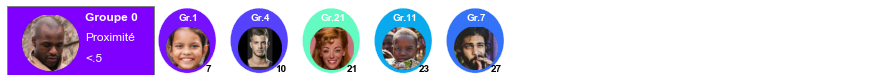

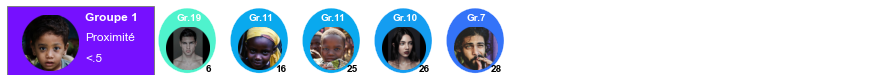

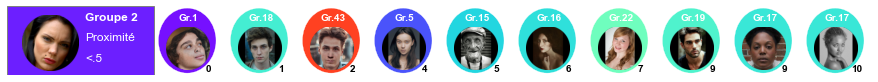

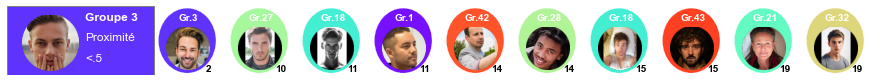

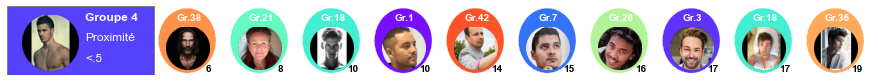

...

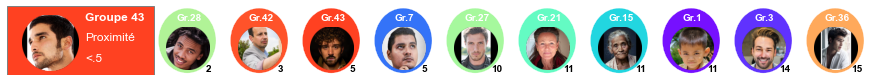

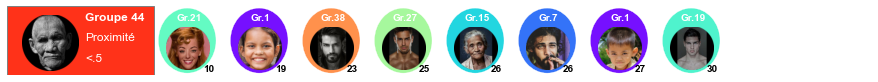

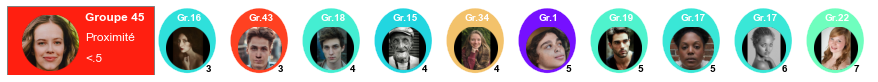

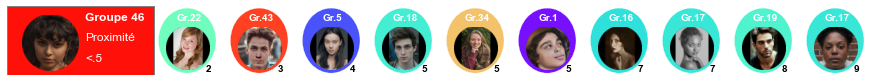

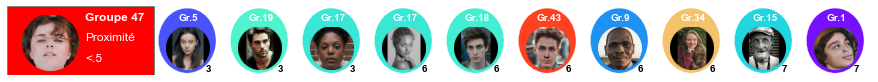

In [49]:
img_centers=[]
for i in range(n_clusters):
    im,dist,c= get_nearest_from0(np.array(centers_[n_clusters][i]),data_sortie,labels=labels_[48],onlylabel=i)
    img_centers.append(im)

for i in range(n_clusters):
 
    show_cluster(img_centers[i],"Groupe "+ str(i),"Proximité","<.5",nearest_clusters[i],names,labels_[48])

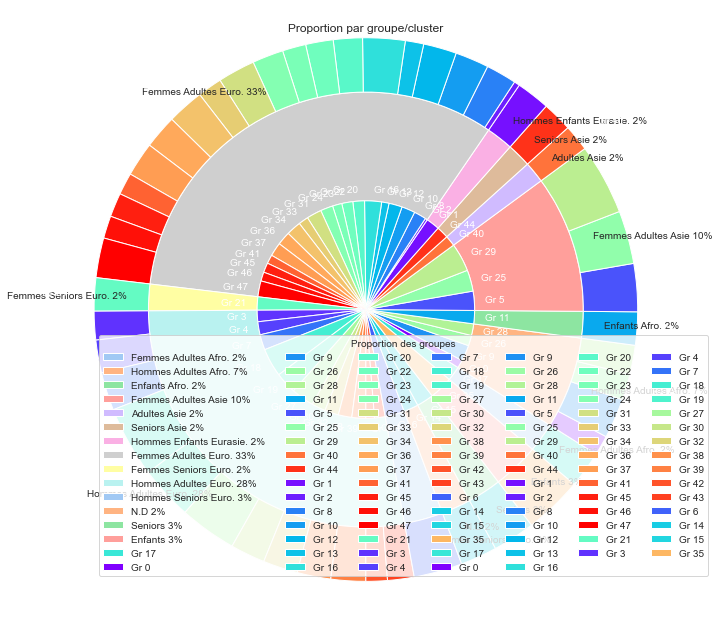

[72, 225, 65, 337, 52, 59, 66, 1077, 65, 915, 95, 72, 83, 114]

In [50]:
def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{}%".format(pct, absolute)


fig, ax = plt.subplots(figsize=(10, 10))
n_supergroup=  grp_lbl
colors=cm.rainbow(np.linspace(0,1,n_clusters))
 
val_clusters = np.bincount(labels_[n_clusters] )
#vals0 =np.array([ [  (i if sg0==sg else None)  for i,sg0 in supergroups]  for sg in np.unique(supergroups)  ])

val_idgroups =[[  i  for i in grp_lbl if grp_lbl[i]==sg ]   for sg in label_sg  ]
val_groups =[[  (val_clusters[i])  for i in grp_lbl if grp_lbl[i]==sg ]   for sg in label_sg  ]
val_groupssum= [ np.sum( s) for s in  val_groups]
val_flatten= np.array( [item for sublist in val_groups for item in sublist]).flatten()

size = 0.5
vals =np.array( [[60., 32.], [37., 40.], [29., 10.]])

cmap = plt.get_cmap("tab20c")
outer_colors = cm.rainbow(np.linspace(0,1,len(val_groupssum)) )

inner_colors = cm.rainbow(np.linspace(0,1,n_clusters))
inner_colors = [  inner_colors[i]  for i in sorted_clusters]  
#colors=outer_colors,
# Pie exterieure
#,autopct=lambda pct: func(pct, val_groupssum)

wedges, texts=ax.pie(val_groupssum, radius=1, 
       wedgeprops=dict(width=size, edgecolor='w'),colors = sns.color_palette('pastel')[0:len(label_sg)],
                                startangle=-40,center=(0,0.2), labels=[ ( s  +" {:.0f}%".format( int(np.round(100.*val_groupssum[i]/np.sum(val_groupssum)))))  for i,s in enumerate(label_named)])   


wedges2, texts2=  ax.pie(val_flatten, radius=1+size*0.5, colors=inner_colors,
       wedgeprops=dict(width=size*0.5, edgecolor='w'), center=(0,0.2), textprops=dict(color="w") , startangle=-40,labels=labels) 


    
wedges2, texts2=  ax.pie(val_flatten, radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'), center=(0,0.2), textprops=dict(color="w") , startangle=-40,labels=labels)    # Pie interieure

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

#for i, p in enumerate(wedges):
#    ang = (p.theta2 - p.theta1)/2. + p.theta1
#    y = np.sin(np.deg2rad(ang))
#    x = np.cos(np.deg2rad(ang))
#    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
#    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
#    kw["arrowprops"].update({"connectionstyle": connectionstyle})
#    ax.annotate("G" + label_sg[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
#               **kw) #  horizontalalignment=horizontalalignment,
    

#ax.legend(wedges2, labels,
#          title="Proportion des groupes",
#          loc="upper left",
#          bbox_to_anchor=(1, 0, 0.5, 1))

ax.legend( title="Proportion des groupes",ncol=7, loc="lower left")
ax.set(aspect="equal", title='Proportion par groupe/cluster')
plt.show()
val_groups
val_groupssum

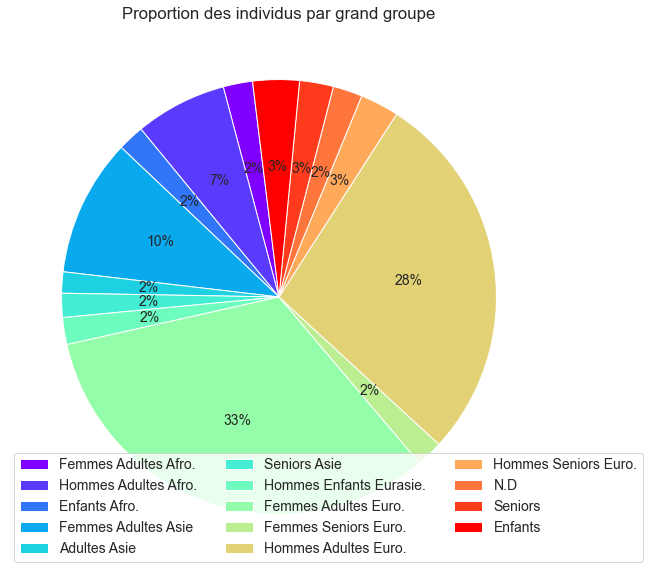

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['font.size'] = 14
fig, ax = plt.subplots(figsize=(10,10))
#define data
data = val_groupssum
labels = label_named

#define Seaborn color palette to use
colors = cm.rainbow(np.linspace(0,1,len(labels)))

#create pie chart
patches,texts,g = plt.pie(data, colors = colors,startangle=97,autopct='%.0f%%')

ax.set(aspect="equal", title='Proportion des individus par grand groupe')
plt.legend(patches, labels,loc="best",ncol=3)
plt.show()

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns


def draw_group_pie(title, field, values ,labels):
    fig, ax = plt.subplots(figsize=(7, 7))
    #define data
    label_sg = values
    val_clusters = np.bincount(labels_[n_clusters] )
    #vals0 =np.array([ [  (i if sg0==sg else None)  for i,sg0 in supergroups]  for sg in np.unique(supergroups)  ])
    val_idgroups =[[  i  for i in grp_lbl if grp_lbl[i]==sg ]   for sg in label_sg  ]
    val_groups =[[  (val_clusters[i])  for i in grp_lbl if label_grp[i][field] ==sg ]   for sg in label_sg  ]
    val_groupssum= [ np.sum( s) for s in  val_groups]
    data = val_groupssum
    #define Seaborn color palette to use
    colors = sns.color_palette('pastel')[0:len(labels)]
    #create pie chart
    plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
    ax.set(aspect="equal", title=title)
    plt.show()

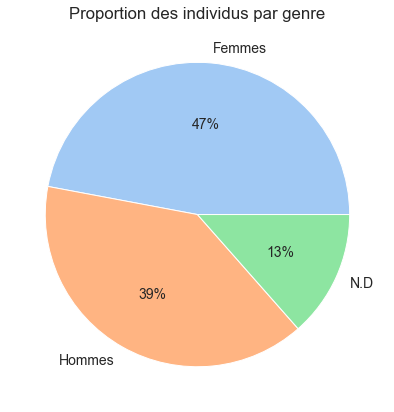

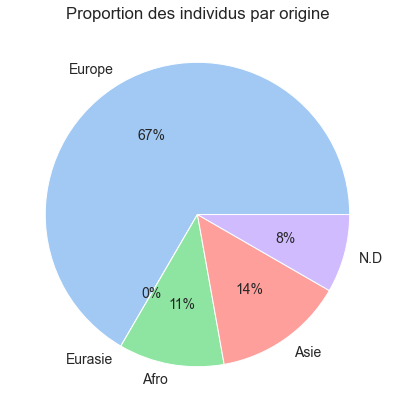

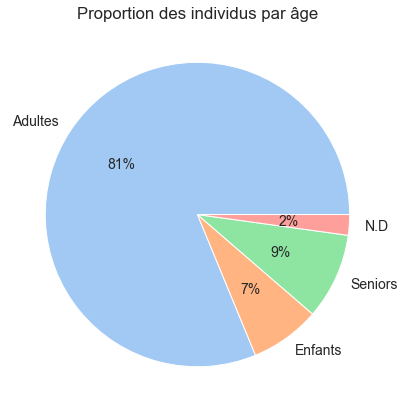

In [53]:
draw_group_pie( 'Proportion des individus par genre',"gender",["F","M",""] ,["Femmes","Hommes","N.D"])
draw_group_pie( 'Proportion des individus par origine',"origin",["EURO","EURASIE","AFRO","ASIE",""] ,["Europe","Eurasie","Afro","Asie","N.D"])
draw_group_pie( 'Proportion des individus par âge',"age",["A","Y","O",""] ,["Adultes","Enfants","Seniors","N.D"])